# Credit Card Usage Segmentation Project Using Clustering

## Project Overview:
This project focuses on developing **unsupervised learning** models for **customer segmentation** based on ***credit card usage*** data. The models aim to provide insights into distinct **customer segments**, improve **credit risk assessment**, and optimize **marketing strategies**. Deliverables include **segmentation models**, comprehensive data **visualizations**, and a comparative analysis of various algorithms.

## 1. Importing Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram
import warnings
warnings.filterwarnings('ignore')

## 2. Load and Inspect Dataset

In [6]:
df = pd.read_csv("CreditCard_Data.csv")
data = df.copy()

In [7]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [8]:
data.shape

(8950, 18)

In [9]:
data.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [10]:
data['CUST_ID'].value_counts()

CUST_ID
C10001    1
C16135    1
C16129    1
C16130    1
C16131    1
         ..
C13065    1
C13064    1
C13063    1
C13062    1
C19190    1
Name: count, Length: 8950, dtype: int64

In [11]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


#### Key Findings:
There are 18 features ***(CUST_ID, BALANCE, BALANCE_FREQUENCY, PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES, CASH_ADVANCE, PURCHASES_FREQUENCY, ONEOFF_PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY, CASH_ADVANCE_FREQUENCY, CASH_ADVANCE_TRX, PURCHASES_TRX, CREDIT_LIMIT, PAYMENTS, MINIMUM_PAYMENTS, PRC_FULL_PAYMENT, TENURE)*** having ***8950*** customers.

**Description:**
- ***CUST_ID:*** A unique identifier for each customer.
- ***BALANCE:*** The current balance on the credit card account.
- ***BALANCE_FREQUENCY:*** Could indicate how often the balance changes.
- ***PURCHASES:*** Total amount of purchases made.
- ***ONEOFF_PURCHASES:*** Amount spent on one-time purchases.
- ***INSTALLMENTS_PURCHASES:*** Amount spent on purchases paid in installments.
- ***CASH_ADVANCE:*** Total amount of cash advances taken.
- ***PURCHASES_FREQUENCY:*** How often purchases are made.
- ***ONEOFF_PURCHASES_FREQUENCY:*** Frequency of one-time purchases.
- ***PURCHASES_INSTALLMENTS_FREQUENCY:*** How often installment purchases are made.
- ***CASH_ADVANCE_FREQUENCY:*** Frequency of cash advances.
- ***CASH_ADVANCE_TRX:*** Number of cash advance transactions.
- ***PURCHASES_TRX:*** Total number of purchase transactions.
- ***CREDIT_LIMIT:*** The credit limit on the account.
- ***PAYMENTS:*** Total amount of payments made.
- ***MINIMUM_PAYMENTS:*** Total amount of minimum payments made.
- ***PRC_FULL_PAYMENT:*** Percentage of times the full payment was made.
- ***TENURE:*** Length of time the customer has had the credit card account.

The dtype of ***CUST_ID*** is ***object*** and it contains **unique** customer ID for each customer.
The transaction features ***(CASH_ADVANCE_TRX, PURCHASES_TRX, TENURE)*** are ***int*** dtype since it tells us the **number** of transactions and **months**. Remaining features which are related to **amount** and **frequency** which are ***float*** in nature.

***Next Steps:*** Let's see if any of the features had Missing values/NULL vlaues and treat them appropriately.

## 3. Handling NULL values

### 3.1 Check for missing values

Let's see the number of missing values present in the dataset.

In [17]:
data.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

#### Key Findings:
The features ***CREDIT_LIMIT*** and ***MINIMUM_PAYMENTS*** had missing values in the dataset. For ***CREDIT_LIMIT***, there is **1** NULL value out of 8950 observations. Whereas for ***MINIMUM_PAYMENTS***, there are **313** NULL values out of 8950 observations which is about **3.5%** of the data.

***Next Steps:*** To impute the NULL values of ***CREDIT_LIMIT*** and ***MINIMUM_PAYMENTS***, lets visualize their distributions in histogram and check their skewness for further evaluation.

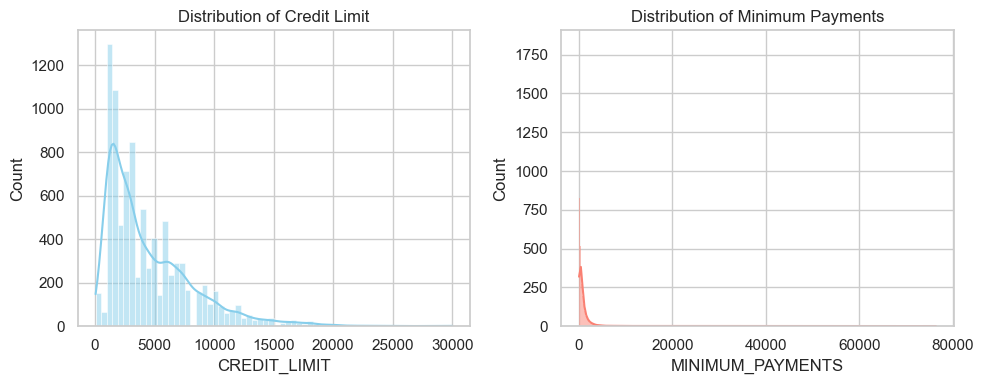

Skewness of CREDIT_LIMIT: 1.5224640052886198
Skewness of MINIMUM_PAYMENTS: 13.622796994677456


In [20]:
sns.set(style="whitegrid")

# Visualize CREDIT_LIMIT
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.histplot(data['CREDIT_LIMIT'], kde=True, color='skyblue')
plt.title("Distribution of Credit Limit")

# Visualize MINIMUM_PAYMENTS
plt.subplot(1, 2, 2)
sns.histplot(data['MINIMUM_PAYMENTS'], kde=True, color='salmon')
plt.title("Distribution of Minimum Payments")

plt.tight_layout()
plt.show()

# Check skewness
print("Skewness of CREDIT_LIMIT:", data['CREDIT_LIMIT'].skew())
print("Skewness of MINIMUM_PAYMENTS:", data['MINIMUM_PAYMENTS'].skew())


#### Observations:

| Feature            | Skewness Value | Interpretation                                              |
| ------------------ | -------------- | ----------------------------------------------------------- |
| CREDIT_LIMIT       | **1.52**       | Moderately right-skewed (long tail to the right)            |
| MINIMUM_PAYMENTS   | **13.62**      | Extremely right-skewed (heavily concentrated at low values) |

Skewness > 1 indicates strong right skew.

Skewness > 10 is highly skewed, and the mean is extremely unreliable as a central measure.

The skewness of ***CREDIT_LIMIT*** was 1.52, and for ***MINIMUM_PAYMENTS***, it was 13.62, indicating strong right-skewed distributions in both cases—particularly extreme in ***MINIMUM_PAYMENTS***.

Let's do the ***box plots*** for both the features ***(CREDIT_LIMIT, MINIMUM_PAYMENTS)*** for better visual clarity of their respective outliers.

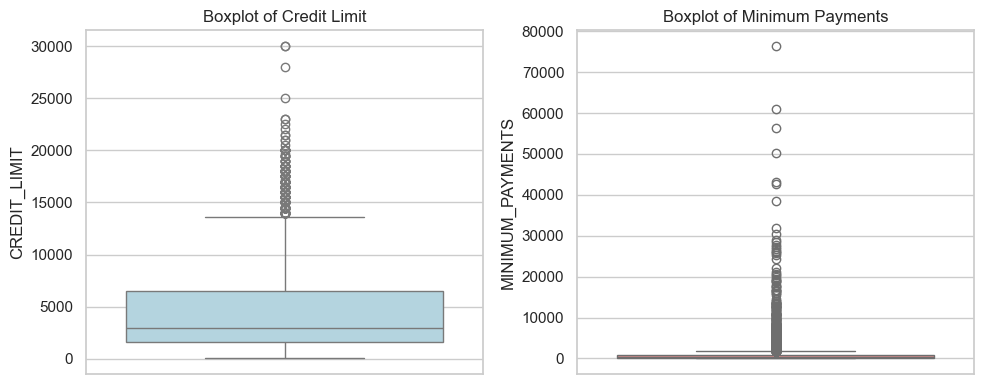

In [24]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.boxplot(y=data['CREDIT_LIMIT'], color='lightblue')
plt.title("Boxplot of Credit Limit")

plt.subplot(1, 2, 2)
sns.boxplot(y=data['MINIMUM_PAYMENTS'], color='lightcoral')
plt.title("Boxplot of Minimum Payments")

plt.tight_layout()
plt.show()

#### Observations:

- ***CREDIT_LIMIT*** shows a **moderate number of high outliers**, indicating that a few customers have very large credit limits compared to the majority.
- ***MINIMUM_PAYMENTS*** displays **a large number of extreme outliers**, confirming the extremely **right-skewed** distribution observed earlier through skewness statistics.

***Next Steps***: We will fill the NULL values of ***CREDIT_LIMIT*** and ***MINIMUM_PAYMENTS*** with medians of their distributions because in such skewed distributions, the mean is influenced heavily by a few large values (outliers), which can distort imputed values. Therefore, we use the median to fill in the missing values, as it is a robust measure of central tendency that better reflects the majority of data points without being affected by outliers.

### 3.2 Treating NULL values

Due to the presence of significant outliers in both features, using the **median** for imputing missing values is more appropriate than the mean. The median is not affected by extreme values and provides a more **robust and accurate estimate** of central tendency for skewed distributions.

In [29]:
data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].median(), inplace=True)
data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median(), inplace=True)

In [30]:
data.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

#### Summary:

We got ***1*** Null Value in ***CREDIT_LIMIT*** and 313 Null Values i.e., **~3.5%** of data in ***MINIMUM_PAYMENTS***. After visualizing the distributions of both of them, they showed right-skewed distributions, especially ***MINIMUM_PAYMENTS***. Since mean is sensitive to extreme values and may misrepresent the typical customer behavior, we used the **median** to impute missing values. Median is a more robust measure of central tendency in the **presence of skewness** and ensures that outliers do not distort the imputed values.

NULL values are treated and as for the next steps, we will do **Exploratory Data Analysis**.

## 4. Exploratory Data Analysis

Firstly, we can drop the ***CUST_ID*** column since it's unique to all the customers and will effect the Data Analysis as well as clustering model.

In [35]:
data = data.drop('CUST_ID', axis=1)

We'll visualize the distribution of each numerical feature to understand their shape, spread, and skewness - **Feature Distribution**

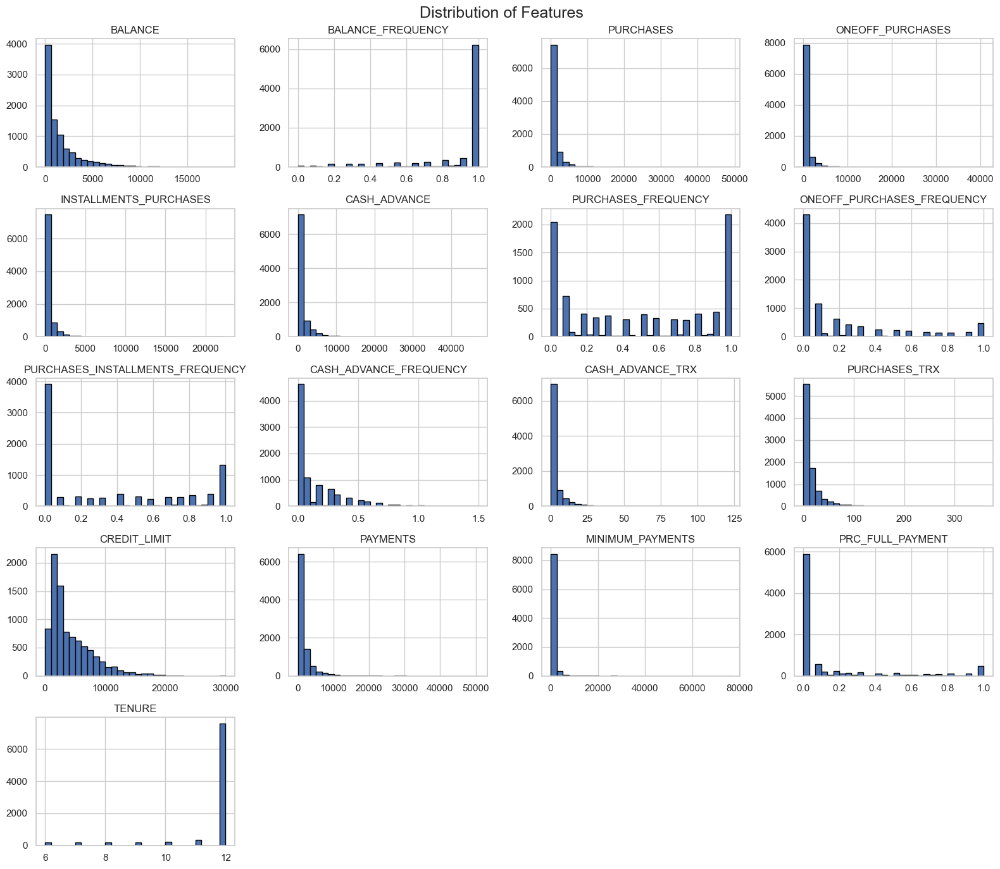

In [37]:
data.hist(figsize=(16, 14), bins=30, edgecolor='black')
plt.suptitle("Distribution of Features", fontsize=18)
plt.tight_layout()
plt.show()

For clearer insights on continuous features ***(BALANCE, PURCHASES, CASH_ADVANCE, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES, CREDIT_LIMIT, PAYMENTS, MINIMUM_PAYMENTS)***, let's use **KDE**

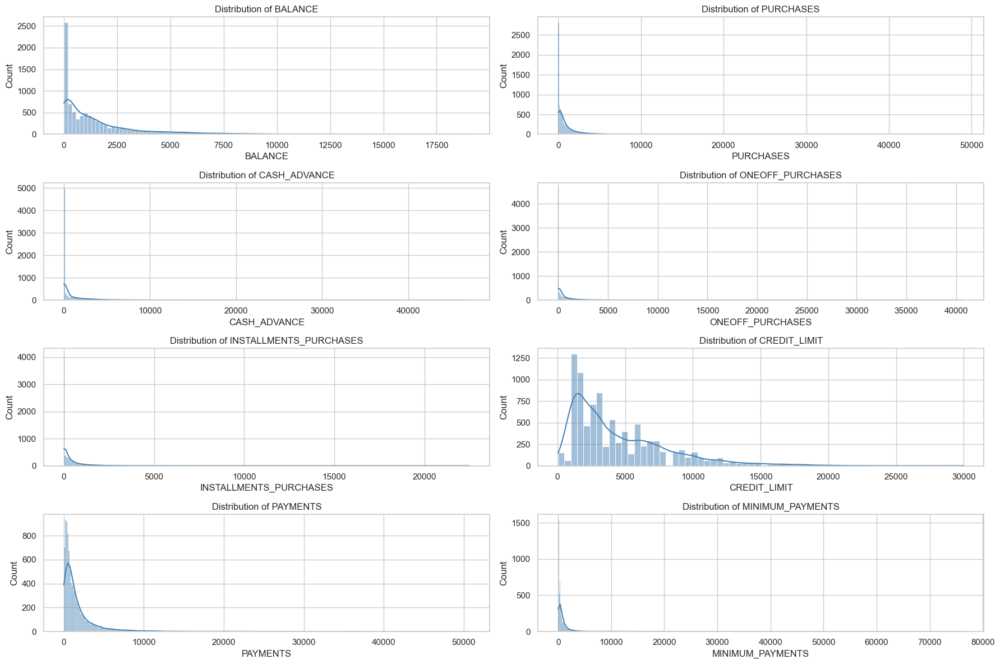

In [39]:
features = ['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']
plt.figure(figsize=(18, 12))
for i, col in enumerate(features, 1):
    plt.subplot(4, 2, i)
    sns.histplot(data[col], kde=True, color='steelblue')
    plt.title(f"Distribution of {col}")
plt.tight_layout()
plt.show()

#### Observations from Feature Distributions (Univariate Analysis)

- Most features like ***BALANCE, PURCHASES, ONEOFF_PURCHASES, CASH_ADVANCE, PAYMENTS, and MINIMUM_PAYMENTS*** are **highly right-skewed**, indicating that a majority of customers have lower values, while a few have extremely high values (outliers).
  
- ***CREDIT_LIMIT*** is also **right-skewed**, but less extreme compared to others. A good number of customers fall under the 2,000 to 5,000 limit range.

- Purchase-related variables ***(PURCHASES, ONEOFF_PURCHASES, and INSTALLMENTS_PURCHASES)*** show similar patterns — **most customers spend small amounts**, with a few high spenders driving the upper range.

- Frequency features such as ***PURCHASES_FREQUENCY, ONEOFF_PURCHASES_FREQUENCY, and PURCHASES_INSTALLMENTS_FREQUENCY*** appear to be **evenly distributed or multimodal** between 0 and 1, indicating varying shopping behaviors.

- ***CASH_ADVANCE*** and ***CASH_ADVANCE_TRX*** are **highly concentrated around 0**, suggesting that **most customers do not frequently use cash advances**, while a small group relies heavily on them.

- ***PRC_FULL_PAYMENT*** is **heavily right-skewed**, showing that many customers rarely pay their full credit balance.

- ***TENURE*** is **heavily concentrated at 12**, meaning the vast majority of customers have had the card for a long period — this could be a constant or semi-constant feature with limited variability.

**Summary & Implications:**

- Several features have **heavy skew and outliers**, which should be kept in mind when applying distance-based clustering like K-Means.
- Features may benefit from **scaling** and potentially **log transformation** before dimensionality reduction or clustering.

***Next Steps***: Let's see the **Skewness stats** and visualize their outlier distributions - ***Boxplots***

We'll do this in two parts:

- Calculate skewness numerically and

- Visualize outliers using boxplots

In [42]:
# Check skewness of all numeric features (higher = more skewed)
data.skew().sort_values(ascending=False)

MINIMUM_PAYMENTS                    13.852446
ONEOFF_PURCHASES                    10.045083
PURCHASES                            8.144269
INSTALLMENTS_PURCHASES               7.299120
PAYMENTS                             5.907620
CASH_ADVANCE_TRX                     5.721298
CASH_ADVANCE                         5.166609
PURCHASES_TRX                        4.630655
BALANCE                              2.393386
PRC_FULL_PAYMENT                     1.942820
CASH_ADVANCE_FREQUENCY               1.828686
ONEOFF_PURCHASES_FREQUENCY           1.535613
CREDIT_LIMIT                         1.522636
PURCHASES_INSTALLMENTS_FREQUENCY     0.509201
PURCHASES_FREQUENCY                  0.060164
BALANCE_FREQUENCY                   -2.023266
TENURE                              -2.943017
dtype: float64

#### Observations from Skewness Analysis

The skewness of numeric features indicates that many variables are **heavily right-skewed**, with long tails extending to the higher end of the value range. Here's a summary of key observations:

**Highly Skewed Features (Skewness > 1):**
- ***MINIMUM_PAYMENTS*** (**13.85**), ***ONEOFF_PURCHASES*** (**10.05**), and ***PURCHASES*** (**8.14**) are **extremely right-skewed**, suggesting a small group of customers spend or pay far more than the rest.
- Other highly skewed variables include:
  - ***INSTALLMENTS_PURCHASES***: 7.30  
  - ***PAYMENTS***: 5.91  
  - ***CASH_ADVANCE_TRX***: 5.72  
  - ***CASH_ADVANCE***: 5.17  
  - ***PURCHASES_TRX***: 4.63  
  - ***BALANCE***: 2.39  
  - ***PRC_FULL_PAYMENT***: 1.94  
  - ***CASH_ADVANCE_FREQUENCY***: 1.83  
  - ***ONEOFF_PURCHASES_FREQUENCY***: 1.54  
  - ***CREDIT_LIMIT***: 1.52  

These features may benefit from **scaling or log transformation** to reduce skewness and improve clustering results.

**Mildly Skewed Features (0.5 < Skewness ≤ 1):**
- ***PURCHASES_INSTALLMENTS_FREQUENCY***: 0.51 — slightly right-skewed, but manageable.

**Symmetric or Normally Distributed:**
- ***PURCHASES_FREQUENCY***: 0.06 — nearly symmetric.

**Left-Skewed Features (Negative Skewness):**
- ***BALANCE_FREQUENCY***: -2.02  
- ***TENURE***: -2.94  

These are **left-skewed**, indicating most values are at the upper end (e.g., most customers have high balance frequency or long tenure).

Now let's observe the **boxplots** of the features to visualize outliers

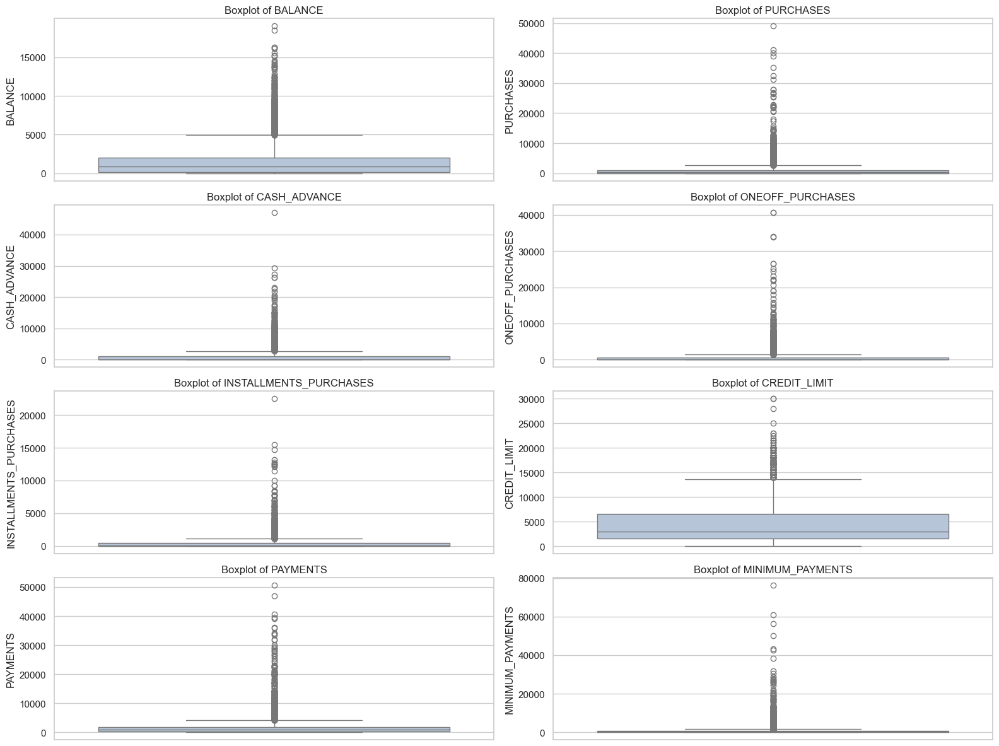

In [45]:
# Plot boxplots
plt.figure(figsize=(16, 12))
for i, col in enumerate(features, 1):
    plt.subplot(4, 2, i)
    sns.boxplot(y=data[col], color='lightsteelblue')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

#### Outlier Detection: Boxplot Observations

The boxplots for key continuous features clearly show the presence of **numerous outliers**, particularly on the higher end of the value ranges. Here are the detailed insights:

***BALANCE***
- Most customers have relatively low balances.
- Several outliers exist beyond **15,000**, indicating a small segment of high-balance customers.

***PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES***
- These purchasing-related features have **strong outliers** extending up to **40,000+**.
- Indicates a few customers make significantly larger purchases than the rest.

***CASH_ADVANCE***
- Clear presence of high outliers above **30,000–40,000**.
- Majority of customers use low or no cash advances, while a small group relies on large amounts.

***CREDIT_LIMIT***
- Skewed with some outliers reaching **30,000**.
- However, distribution is relatively tighter compared to purchase and payment features.

***PAYMENTS***
- High variation in customer payments.
- Several outliers above **50,000**, showing some customers pay very large amounts.

***MINIMUM_PAYMENTS***
- Shows **extreme outliers** beyond **70,000**, reinforcing the earlier skewness observation (**13.85 skew**).
- Indicates strong variation in repayment behavior among customers.

**Implications:**
- Outliers and skewness could distort clustering results, especially for **distance-based models** like K-Means.
- Since there are highly skewed features, let's consider applying log or square root transformations to highly skewed features before clustering and doing standardization or normalization post-transformation to align feature scales.

***Next Steps***: Let's see the correlation heatmap to identify the **strong relationships** between features and **Redundant variables**

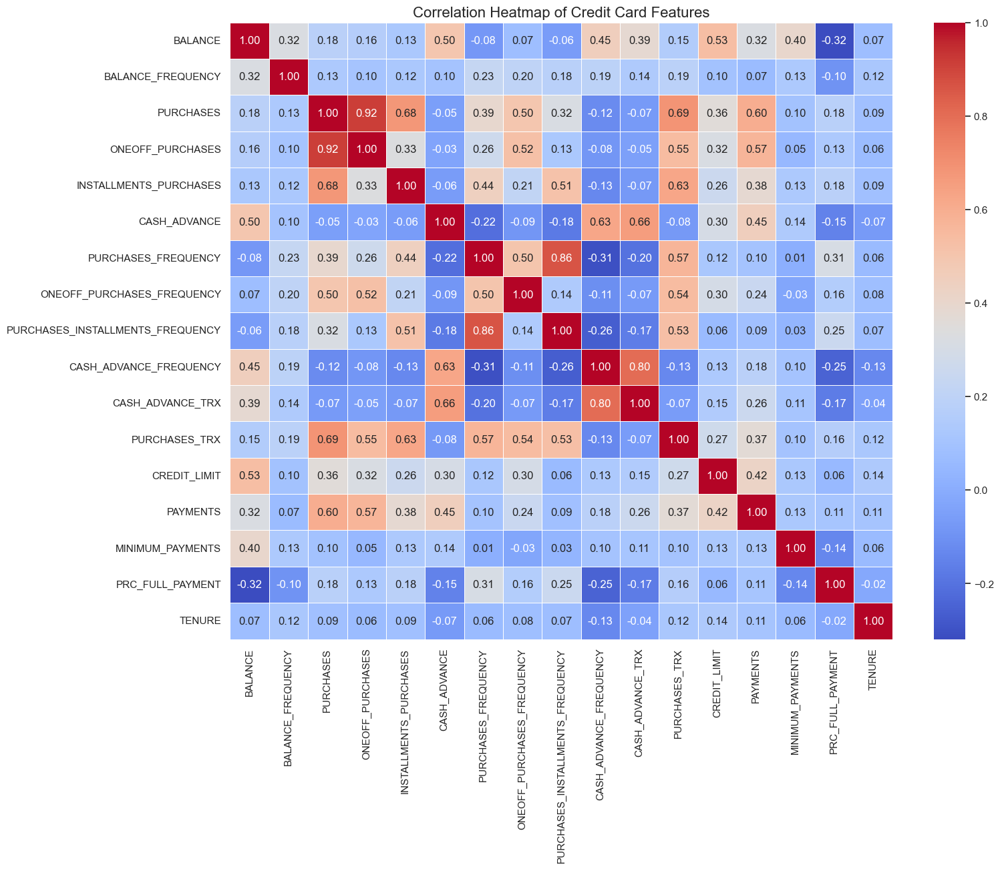

In [48]:
plt.figure(figsize=(16, 12))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title("Correlation Heatmap of Credit Card Features", fontsize=16)
plt.show()

#### Key Insights and Observations from Correlation Heatmap:

The correlation matrix reveals how strongly each numerical feature is linearly related to others. This helps us understand behavioral patterns and identify potential redundancy, which is important for clustering and dimensionality reduction.

---

**Strong Positive Correlations (r > 0.6)**

| Feature Pair                          | Correlation Strength | Interpretation |
|--------------------------------------|----------------------|----------------|
| ***PURCHASES & ONEOFF_PURCHASES***     | High (~0.9)          | Customers with high total purchases tend to have large one-off purchases. |
| ***PURCHASES & INSTALLMENTS_PURCHASES*** | High (~0.8)        | Total purchases are strongly driven by installment spending as well. |
| ***ONEOFF_PURCHASES & PURCHASES_TRX*** | Moderate-High        | High one-off spenders also tend to have many transactions. |
| ***INSTALLMENTS_PURCHASES & PURCHASES_TRX*** | Moderate-High    | Customers who buy in installments also transact more. |
| ***CASH_ADVANCE & CASH_ADVANCE_TRX***  | High (~0.9)          | Higher total cash advances correlate with more transactions. |
| ***PURCHASES_FREQUENCY & PURCHASES_INSTALLMENTS_FREQUENCY*** | Moderate (~0.6) | Customers who purchase more frequently tend to use installment options more. |

---

**Moderate Correlations (0.3 < r < 0.6)**

- ***PAYMENTS*** shows moderate correlation with:
  - ***PURCHASES, BALANCE***, and ***MINIMUM_PAYMENTS*** → suggesting that larger spending and outstanding balances result in higher payments.
- ***CREDIT_LIMIT*** shows mild to moderate positive correlation with:
  - ***BALANCE, PAYMENTS***, and ***PURCHASES*** → those given higher limits tend to use and repay more.

---

**Insights on Negatively Correlated Features**

While most features are positively correlated, a few show **negative correlations**, which can be important to understand **inverse relationships** in customer behavior.

**Notable Negative Correlations (r < -0.3)**

| Feature Pair                          | Correlation Strength | Interpretation |
|--------------------------------------|----------------------|----------------|
| ***PRC_FULL_PAYMENT & BALANCE***       | Moderate (~ -0.4)    | Customers who **fully pay off their balance more often** tend to have **lower outstanding balances**. |
| ***PRC_FULL_PAYMENT & PAYMENTS***      | Mild (~ -0.3)        | Frequent full payers may **pay smaller total amounts**, possibly because they maintain low balances. |
| ***BALANCE_FREQUENCY & BALANCE***      | Mild (~ -0.3 to -0.4)| Customers with **frequent balance updates** tend to **maintain lower balances**. |
| ***TENURE & PRC_FULL_PAYMENT***        | Slightly negative    | Longer-tenure customers are **less likely to pay in full regularly**, possibly due to debt accumulation or different spending habits.

---

**Interpretation**

- These inverse relationships highlight **contrasting customer behaviors** — for example:
  - High spenders and balance carriers tend to pay **less frequently in full**.
  - Customers who **actively manage their balances (high frequency)** tend to **carry less debt**.
- Such opposing patterns can be useful for:
  - Customer segmentation (e.g., spenders vs. conservative users)
  - Building features that represent financial discipline or risk

---

- Let's consider **retaining** some of these negatively correlated features (like ***PRC_FULL_PAYMENT***) even if their individual correlation is low — they may add value in unsupervised models like clustering by capturing **opposite behavior dimensions**.

- **PURCHASES vs ONEOFF_PURCHASES** and **PURCHASES vs INSTALLMENTS_PURCHASES** show **strong positive correlationships**, which is expected since ***PURCHASES*** is the sum of both components. This validates data integrity.
- **PURCHASES vs PURCHASES_TRX** shows a positive correlation, implying that as the number of transactions increases, so does the total purchase value.
- **ONEOFF_PURCHASES vs INSTALLMENTS_PURCHASES** lacks a strong relationship — indicating that most customers tend to prefer one mode of purchase over the other (either lump sum or installment).
- Features are **right-skewed**, with most customers exhibiting lower values and a smaller group contributing to high-end outliers. These outliers may represent high-value or premium customers.

***Next Steps:*** Since we completed analyzing the dataset and drawn powerful insights, Let's proceed with **Data Presprocessing**.

***Next Steps***: With this Data Analysis and insights, let's move on to **Feature Engineering**.

## 5. Data Preprocessing

We already treated the ***NULL*** values before doing EDA, we can do necessary transformations and scaling for the data.

### 5.1 Log Transforming the necessary features

Since features like ***'MINIMUM_PAYMENTS', 'ONEOFF_PURCHASES', 'PURCHASES', 'INSTALLMENTS_PURCHASES', 'PAYMENTS', 'CASH_ADVANCE_TRX', 'CASH_ADVANCE', 'PURCHASES_TRX', 'BALANCE', 'CREDIT_LIMIT'*** are extremely skewed, we have to apply **Log Transform** to reduce their skewness.

In [57]:
data_transformed = data.copy()

log_transform_cols = [
    'BALANCE',
    'PURCHASES',
    'ONEOFF_PURCHASES',
    'INSTALLMENTS_PURCHASES',
    'CASH_ADVANCE',
    'CASH_ADVANCE_TRX',
    'PURCHASES_TRX',
    'CREDIT_LIMIT',
    'PAYMENTS',
    'MINIMUM_PAYMENTS'
]

data_transformed[log_transform_cols] = data_transformed[log_transform_cols].apply(np.log1p)

***Next Steps***: Since we have transformed the skewed features, let's do the scaling. This is important for clustering and PCA.

### 5.2 Feature Scaling

In [60]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_transformed)
data_scaled = pd.DataFrame(scaled_data, columns=data_transformed.columns)

As **StandardScaler** scales our data from ***-1 to +1***, we will also transform data in **MinMaxScaling** which varies from **0 to 1**. Ideally MinMaxScaler might be the correct choice as our data is **currency, frequency and months**.

In [62]:
minmax = MinMaxScaler()
minmax_data = minmax.fit_transform(data_transformed)
data_minmax = pd.DataFrame(minmax_data, columns=data_transformed.columns)

### 5.3 Dimensionality Reduction (PCA & t-SNE)

**Potential Redundancies (High Correlation)**

| Group | Features to Consider for Reduction |
|-------|------------------------------------|
| Total Purchases | ***PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES*** |
| Cash Advance Behavior | ***CASH_ADVANCE, CASH_ADVANCE_TRX*** |
| Purchase Behavior | ***PURCHASES_TRX, PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY*** |

You may consider combining or reducing these using **PCA** to remove redundancy and capture the essence of customer behavior.

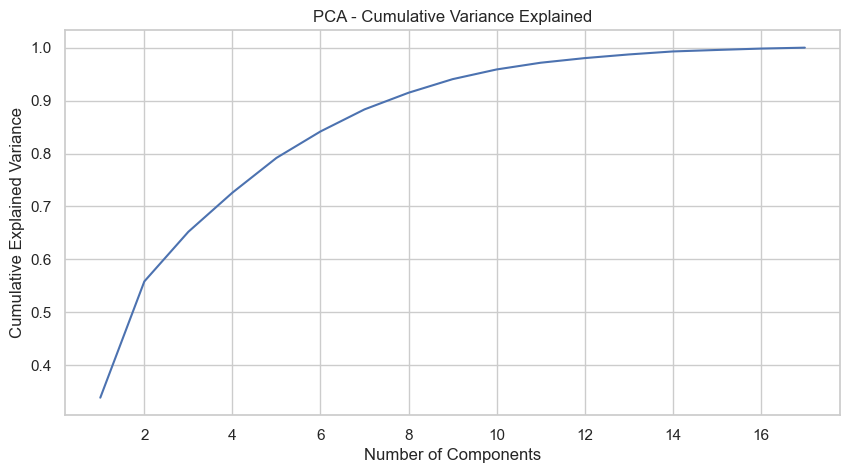

In [65]:
pca = PCA()
pca_data = pca.fit_transform(data_scaled)

plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(pca.explained_variance_ratio_)+1), y=np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA - Cumulative Variance Explained')
plt.grid(True)
plt.show()

#### Observations from PCA – Cumulative Explained Variance Plot

The first 2 principal components capture over 55% of the total variance, indicating a strong dimensionality compression early on.

Around 6 components explain approximately 85–87% of the total variance, which is typically considered good for clustering tasks.

By **10 components**, the cumulative variance explained crosses **95%**, indicating diminishing returns beyond this point.

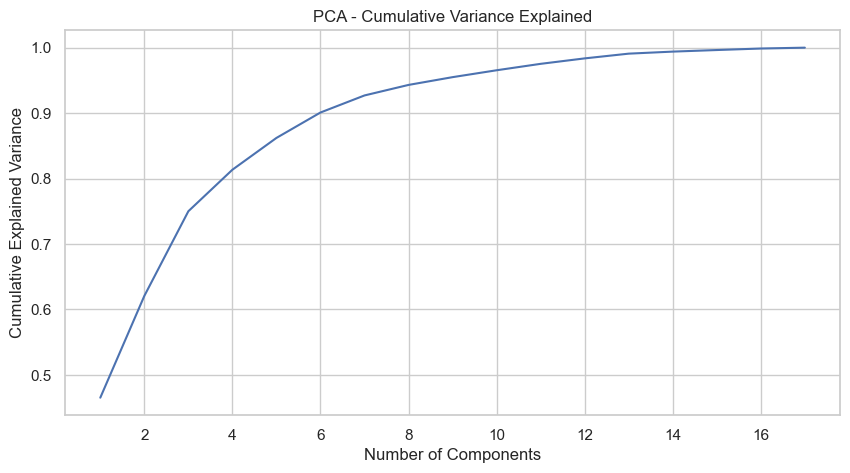

In [67]:
pca_data = pca.fit_transform(data_minmax)

plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(pca.explained_variance_ratio_)+1), y=np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA - Cumulative Variance Explained')
plt.grid(True)
plt.show()

#### StandardScaler vs MinMaxScaler

- **MinMaxScaler** is more suitable for credit card segmentation, as it:
  - Preserves the monetary **scale of features**.
  - Makes distance-based clustering (KMeans, Agglomerative) more meaningful.
- PCA on MinMax-scaled data retains ~90% variance with just **5 components**.
- Final clustering was performed on MinMax-scaled + PCA-transformed data (n=5).

We proceed with **MinMaxScaler + 5 PCA Components** for both **KMeans** and **Agglomerative**.

In [69]:
pca_final = PCA(n_components=5, random_state=42)

pca_data = pca_final.fit_transform(data_minmax)

data_pca = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(5)])

In [70]:
data_pca.head()

,PC1,PC2,PC3,PC4,PC5
0,-0.310089,-0.531123,-0.177425,-0.299582,0.075285
1,-1.029018,0.111618,0.250925,0.254266,0.242496
2,0.381790,0.598059,-0.728119,-0.181867,0.094116
3,-0.537041,0.179188,-0.437775,-0.198031,-0.239815
4,-0.557145,-0.169093,-0.362125,-0.318897,0.274939


In [71]:
data_pca.shape

(8950, 5)

***data_pca*** now contains the reduced dataset with 5 principal components. We will use ***data_pca*** as the input for clustering algorithms like KMeans and Agglomerative Clustering.

***Next Steps:*** Before implementing the clustering algorithms, let's do ***t-SNE*** for 2D visualization.

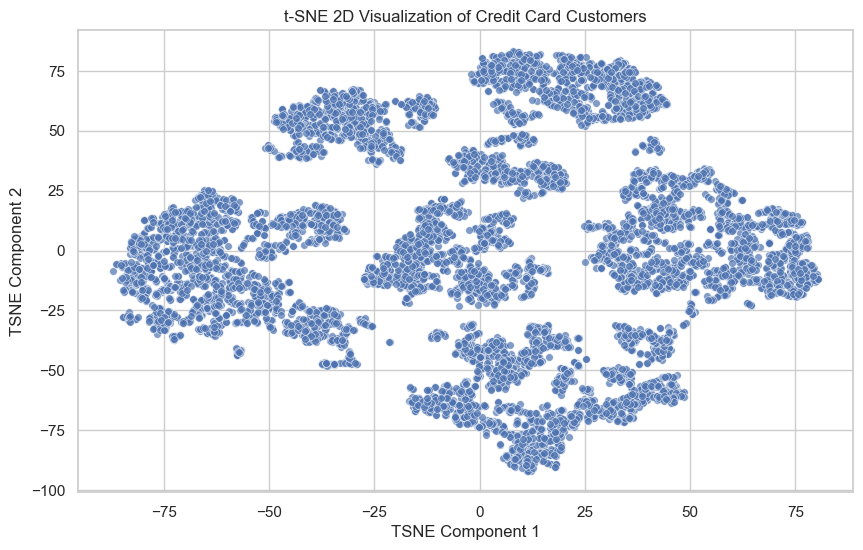

In [73]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_result = tsne.fit_transform(data_minmax)

# Create a DataFrame for easy plotting
data_tsne = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2'])

# Visualize
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data_tsne, x='TSNE1', y='TSNE2', s=30, alpha=0.7)
plt.title("t-SNE 2D Visualization of Credit Card Customers")
plt.xlabel("TSNE Component 1")
plt.ylabel("TSNE Component 2")
plt.grid(True)
plt.show()

#### Observations from t-SNE 2D Visualization

- The plot displays **distinct clusters and dense regions**, suggesting natural groupings exist within the customer base.

- A few clusters are **well-separated**, indicating clear behavioral differences among those customer segments.

- Some **overlapping or closely packed clusters** may represent customers with similar usage patterns but slight variations.

- The **spread of data** across both t-SNE components implies **multi-dimensional complexity**, validating the need for clustering techniques.

- This visualization is purely for **exploratory purposes** and **does not indicate actual clusters** — clustering will be done using KMeans and Agglomerative methods on PCA-reduced data.

***Next Steps***: Let's proceed to fit the clustering models - **K-Means Clustering** and **Agglomerative Clustering** using ***data_pca*** (5 components)

## 6. Fitting the Model

### 6.1 K-Means Clustering

Let's perform **K-Means Clustering** on ***data_pca*** with 5 components using **Elbow Method** for finding ***optimal k***.

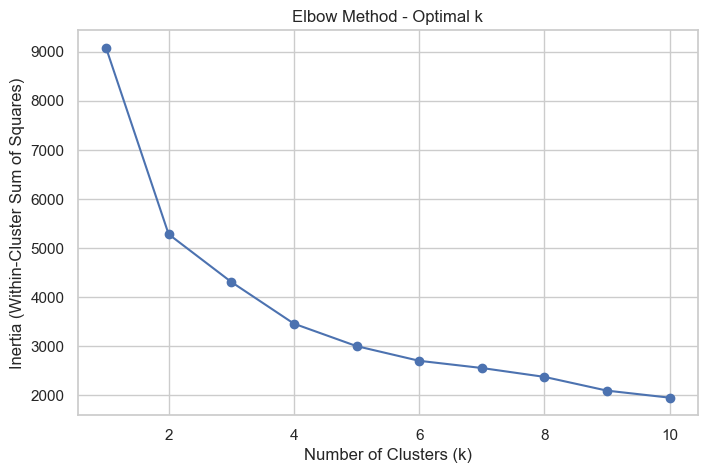

In [79]:
# Try different cluster counts
inertia = []
cluster_range = range(1, 11)

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_pca)
    inertia.append(kmeans.inertia_)

# Plot Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertia, marker='o')
plt.title("Elbow Method - Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-Cluster Sum of Squares)")
plt.grid(True)
plt.show()

**From the Elbow Method plot, we can see:**

There’s a **sharp drop** in inertia from **k=1 to k=2**, and then a **less steep drop** from **k=2 to k=3**.

After **k=3**, the curve **begins to flatten**, meaning adding more clusters gives **diminishing returns** in terms of reducing inertia.

**Therefore,** The ***"elbow"*** appears around ***k=2 or k=3***. Both are reasonable, but to choose confidently, we should now plot the **Silhouette Score** curve and pick the **value of k** that gives a **balance of high silhouette score and clear elbow in inertia**.

***Next Steps:*** We have to find **high Silhouette score** for the **better cluster separation**. Choose the k with a **good balance between inertia** and **silhouette score**.

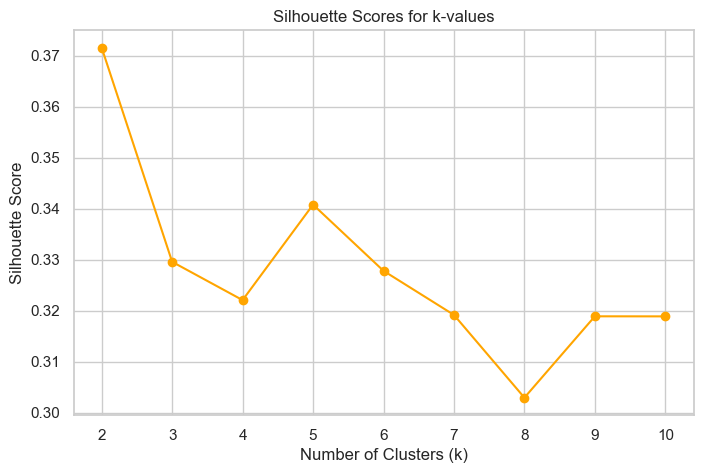

In [82]:
sil_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data_pca)
    score = silhouette_score(data_pca, labels)
    sil_scores.append(score)

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), sil_scores, marker='o', color='orange')
plt.title("Silhouette Scores for k-values")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.show()

#### Silhouette Score Analysis – KMeans

- **Highest Silhouette Score** is observed at **k = 2** with a value of approximately **0.37**, indicating that the data naturally separates well into **2 clusters**.
- As `k` increases beyond 2, the silhouette score **gradually declines**, suggesting **weaker cohesion and separation** between clusters.
- Minor local peaks at `k = 5` and `k = 9` indicate **slight structure**, but the overall silhouette values remain lower than at `k = 2`.
- The score dips most at `k = 8`, highlighting a **poor clustering configuration**.
  
**Insight:**  
The plot supports selecting **k = 2** as the optimal number of clusters for KMeans. This aligns with our segmentation goal of distinguishing between two major customer archetypes (For example, **Cash-Oriented vs Purchase-Oriented** or **Risky vs Responsible**).

We will proceed with **KMeans (k = 2)** for final segmentation.

***Next Steps:*** Let's fit **K-Means Clustering** with ***k=2*** and then visualize the clusters using **PCA-reduced 2D data**

In [85]:
# Fit KMeans with k=2 on PCA-reduced data
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans_labels = kmeans.fit_predict(data_pca)

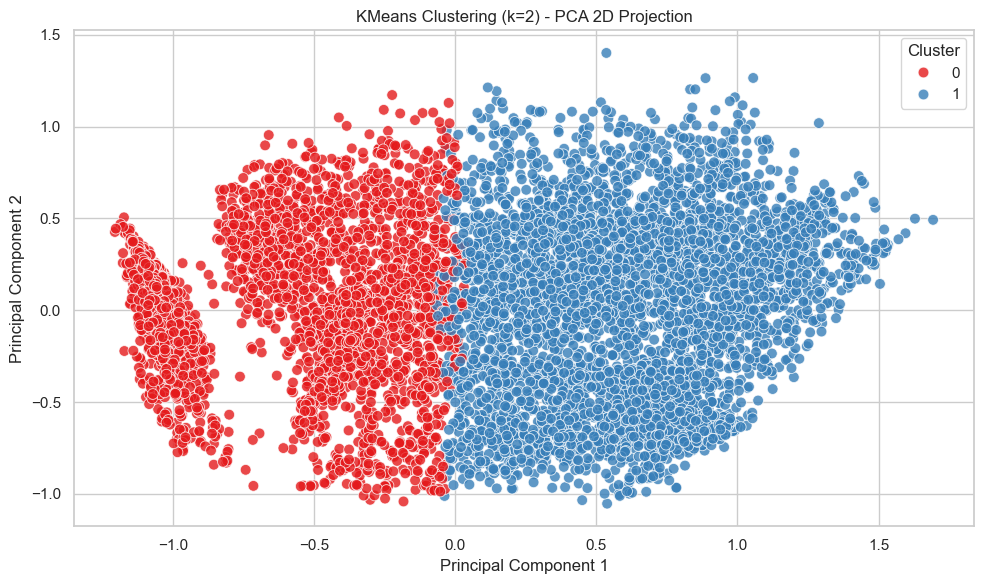

In [86]:
# Plot clusters using first two PCA components
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=data_pca.iloc[:, 0], y=data_pca.iloc[:, 1],
    hue=kmeans_labels, palette='Set1', s=60, alpha=0.8
)
plt.title('KMeans Clustering (k=2) - PCA 2D Projection')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

Let's try to visualize with PCA **3D** projection

In [88]:
Data_pca = data_pca.copy()
# Optional: Rename first 3 PCs for clarity
Data_pca.rename(columns={Data_pca.columns[0]: 'PC1',
                         Data_pca.columns[1]: 'PC2',
                         Data_pca.columns[2]: 'PC3'}, inplace=True)

Data_pca['K_Cluster'] = kmeans_labels

# Create interactive 3D scatter plot
fig = px.scatter_3d(Data_pca, x='PC1', y='PC2', z='PC3',
                    color='K_Cluster',
                    title='Interactive 3D PCA Projection with KMeans Clusters',
                    symbol='K_Cluster',
                    opacity=0.7,
                    width=900, height=700)

centers = kmeans.cluster_centers_[:, :3]

# Add each centroid as a black 'X' marker
fig.add_trace(
    go.Scatter3d(
        x=centers[:, 0],
        y=centers[:, 1],
        z=centers[:, 2],
        mode='markers',
        marker=dict(size=10, color='black', symbol='x'),
        name='Centroids'
    )
)
# Show plot
fig.show()

#### Key findings from K-Means Clustering:

- The PCA plot visualizes the two clusters formed using the **KMeans algorithm** with `k = 2`.
- Clusters are clearly split along the **Principal Component 1 (PC1)** axis, showing a strong linear boundary between **Cluster 0 (Red)** and **Cluster 1 (Blue)**.
- **Cluster 0 (Red):** Densely packed on the left (negative PC1 values), might possibly indicating **low transaction volume**, **high cash usage**, or **riskier behavior**.
- **Cluster 1 (Blue):** Occupies the right half (positive PC1), might be representing **digitally active**, **purchase-oriented**, or **high-value customers**.
- The clean split and symmetrical layout suggest that **KMeans effectively separated the customer base** into two distinct groups with minimal overlap.

**Insight:**  
KMeans clustering (k = 2) yields **well-separated, linearly partitioned clusters**, making it a good candidate for scalable and interpretable customer segmentation.

***Next Steps:*** Let's do the plotting of ***t-SNE*** visualization **coloured by cluster labels** which is best way to visually validate how well **K-Means** clustered the data, especially when the **data is more complex** with working on customer behavioural patterns.

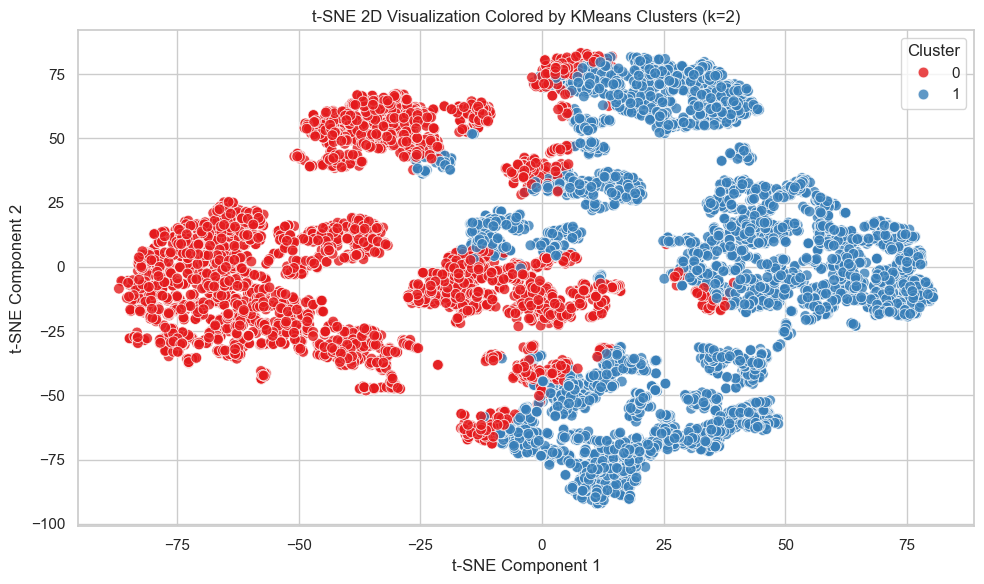

In [91]:
# Add KMeans cluster labels to tsne data which are obtained before
data_tsne['K_Cluster'] = kmeans_labels

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=data_tsne, x='TSNE1', y='TSNE2', 
    hue='K_Cluster', palette='Set1', s=60, alpha=0.8
)
plt.title("t-SNE 2D Visualization Colored by KMeans Clusters (k=2)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

#### t-SNE 2D Visualization Insights
- Clusters are **very well-separated** with minimal overlap.
- Shows **high intra-cluster density** and **inter-cluster spacing**, indicating robust partitioning.
- The spatial structure captured by t-SNE suggests **strong local patterns** in the high-dimensional space are retained by KMeans.

***Next Steps:*** Since we have evaluated the data with **K-Means Clustering**, now we will evaluate using **Agglomerative Clustering**.

### 6.2 Agglomerative Clustering

Let's perform **Agglomerative Clustering** on ***data_pca*** with 5 components and for **optimal k**, we will use the k with the highest **Silhouette Score**

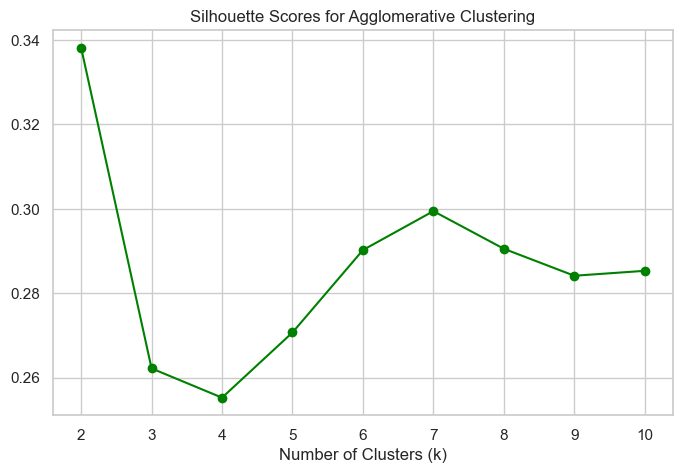

In [96]:
sil_scores_agglo = []
cluster_range = range(2, 11)

for k in cluster_range:
    model = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = model.fit_predict(data_pca)
    sil_scores_agglo.append(silhouette_score(data_pca, labels))

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, sil_scores_agglo, marker='o', color='green')
plt.title("Silhouette Scores for Agglomerative Clustering")
plt.xlabel("Number of Clusters (k)")
plt.ylabel
plt.show()

#### Silhouette Score Analysis – Agglomerative Clustering

- **Highest Silhouette Score** is observed at **k = 2** (≈ 0.34), suggesting that dividing the data into **2 clusters** results in the best separation and cohesion.
- A noticeable **drop at k = 3 and k = 4** indicates poor clustering at those values.
- While the score slightly recovers around **k = 6 to 7**, it does **not surpass the peak at k = 2**, meaning those configurations are less optimal.
- Overall, scores stay **below 0.30** beyond `k = 2`, implying weaker structure in higher-cluster solutions.

**Insight:**  
The **optimal number of clusters is again k = 2**, which aligns with the KMeans findings. This reinforces the idea that the dataset is best segmented into two distinct customer groups.

We proceed with **Agglomerative Clustering (k = 2)** for structural comparison and validation.


***Next Steps:*** Let's fit **Agglomerative Clustering** with ***k=2*** and then visualize the clusters using **PCA-reduced 2D data**

In [99]:
# Fit Agglomerative model
agglo = AgglomerativeClustering(n_clusters=2, linkage='ward')
agglo_labels = agglo.fit_predict(data_pca)

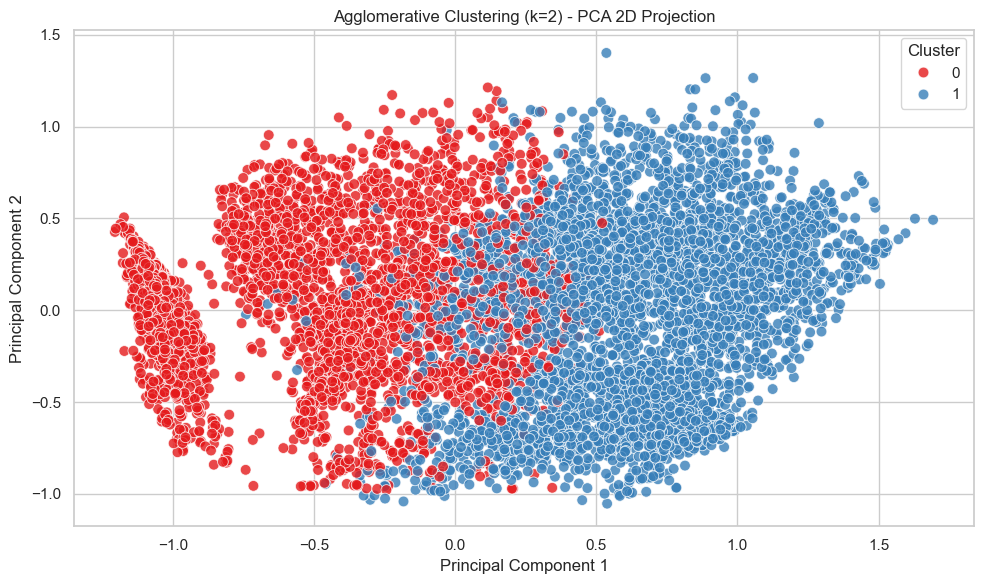

In [100]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=data_pca.iloc[:, 0], y=data_pca.iloc[:, 1],
    hue=agglo_labels, palette='Set1', s=60, alpha=0.8
)
plt.title('Agglomerative Clustering (k=2) - PCA 2D Projection')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

#### Agglomerative Clustering (k = 2) – PCA 2D Cluster Visualization

- The plot shows **two clearly separated clusters**, represented in **red (Cluster 0)** and **blue (Cluster 1)**.
- The separation along the **Principal Component 1 (PC1)** axis indicates that the main differentiating features between these clusters are captured well in the first component.
- **Cluster 0 (Red):** Appears more concentrated and skewed toward the negative PC1 axis.
- **Cluster 1 (Blue):** Occupies a broader space with a rightward spread on PC1.
- The clusters show **minimal overlap**, validating the silhouette score and the strength of separation.
- Indicates **some hierarchical merging boundaries** in feature space that are not strictly linear.

**Insight:**  
The PCA plot confirms that Agglomerative Clustering with **k = 2** creates **distinct, interpretable customer groups** that align well with business goals like risk segmentation and tailored marketing.

***Next Steps:*** Let's do the plotting of ***t-SNE*** visualization **coloured by cluster labels** which is best way to visually validate how well ***Agglomerative Clustering*** clustered the data, especially when the data is **more complex** with working on customer behavioural patterns.

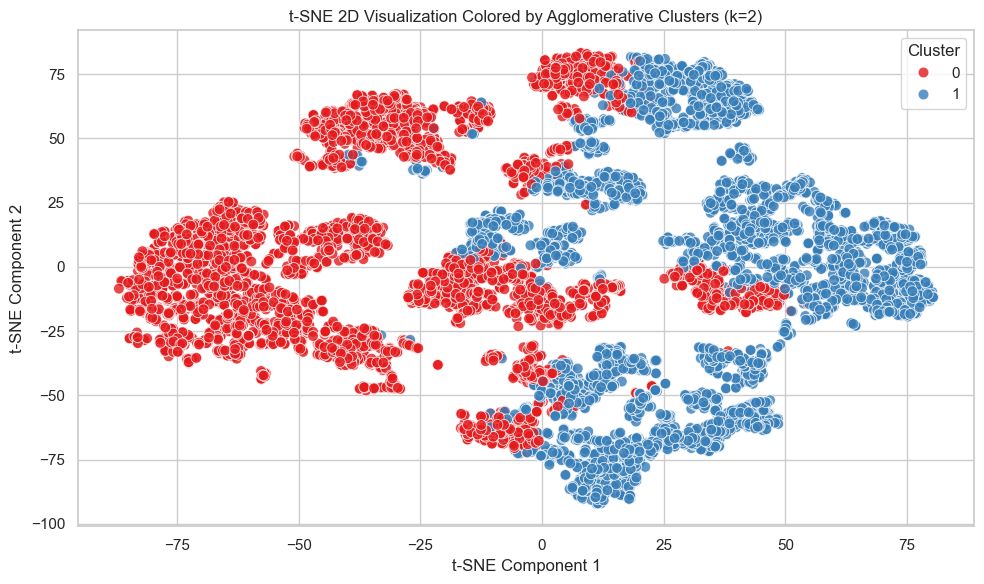

In [103]:
# Add agglomerative cluster labels to tsne data which are obtained before
data_tsne['agglo_Cluster'] = agglo_labels

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=data_tsne, x='TSNE1', y='TSNE2', 
    hue='agglo_Cluster', palette='Set1', s=60, alpha=0.8
)
plt.title("t-SNE 2D Visualization Colored by Agglomerative Clusters (k=2)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

#### Observations: t-SNE with Agglomerative Clustering (k=2):

- **Clear Separation:** The two clusters are **visually well-separated**, with minimal overlap, indicating that ***Agglomerative Clustering*** has been **effective** in capturing **distinct customer groups**.
- **Compact Clusters:** **Cluster 1** (blue) appears **more compact and tightly grouped**, possibly representing a more **homogeneous group** of customers.
- **Wide Spread of Cluster 0:** **Cluster 0** (red) shows **more dispersion** across the plot, implying **higher intra-cluster variability** or **more diverse behaviors** within that cluster.
- **t-SNE Alignment:** The **cluster separation** aligns well with **t-SNE’s nonlinear projection**, suggesting **meaningful structure** in the data.

#### PCA 2D Projection Comparison: (KMeans vs Agglomerative Clustering)

##### Comparative Summary: PCA 2D Visuals (KMeans vs Agglomerative)

| Feature                     | KMeans Clustering                      | Agglomerative Clustering             |
|----------------------------|----------------------------------------|--------------------------------------|
| Cluster Boundary           | Sharp and linear                       | Fuzzy and hierarchical               |
| Cluster Compactness        | Higher (especially for Cluster 0)      | Moderate                             |
| Separation in PCA Space    | Clear split along Principal Component 1| Some overlap                         |
| Interpretability           | Easy to interpret                      | Slightly nuanced                     |

**Conclusion**:
- **KMeans** offers better **linearly separable and compact clusters** in PCA space.
- **Agglomerative Clustering** reveals **more organic boundaries**, which may reflect underlying customer hierarchies.

***Next Steps:*** Let's now proceed to **profiling the clusters** to find out how **data differs by original features** like payments, purchases, etc. Usually, we get the **most insightful part** for the business from ***profiling clusters***.

### 6.3 Cluster Profile

Let's see the cluster profiling of ***K-Means Clustering***

In [109]:
# Merge cluster labels with scaled data
data_profile = data.copy()
data_profile['km_Cluster'] = kmeans_labels

In [110]:
# Compute mean of each feature per cluster
km_cluster_means = data_profile.groupby('km_Cluster').mean().T  # Transpose for easier viewing

<Figure size 1400x1000 with 0 Axes>

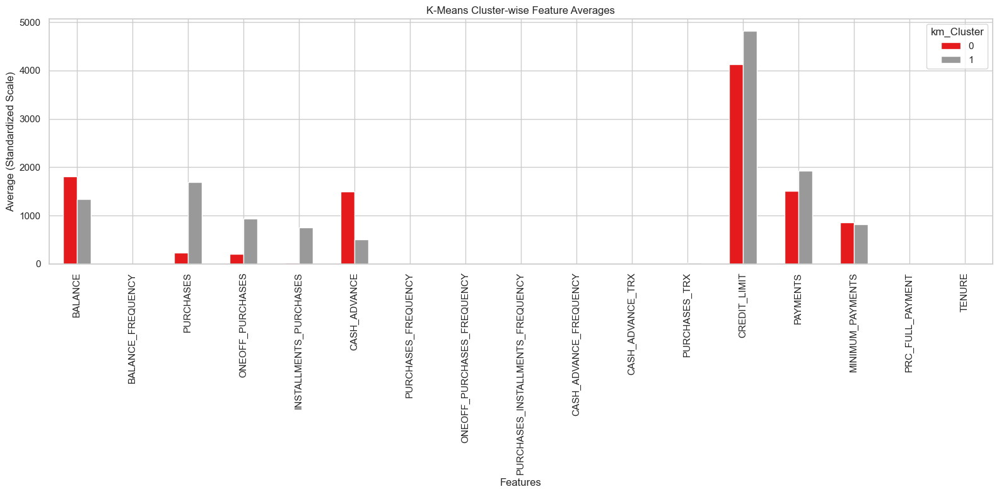

In [111]:
# Plot feature differences across clusters
plt.figure(figsize=(14, 10))
km_cluster_means.plot(kind='bar', figsize=(16, 8), colormap='Set1')
plt.title('K-Means Cluster-wise Feature Averages')
plt.ylabel('Average (Standardized Scale)')
plt.xlabel('Features')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

### KMeans Cluster Profiling (k=2)

We analyze the feature-wise means for the two clusters formed by KMeans to understand distinct customer segments.

| Feature                             | Cluster 0 (Red)       | Cluster 1 (Blue)       | Key Interpretation |
|-------------------------------------|----------------------|----------------------|---------------------|
| **BALANCE**                         | 1804.55              | 1347.77              | Cluster 0 maintains higher balances, indicating less credit utilization or higher credit availability. |
| **BALANCE_FREQUENCY**              | 0.83                 | 0.92                 | Cluster 1 accesses their balance more regularly — possibly more engaged users. |
| **PURCHASES**                       | 233.91               | 1697.60              | Cluster 1 is highly purchase-active, spending significantly more. |
| **ONEOFF_PURCHASES**               | 211.12               | 936.63               | Cluster 1 prefers one-time purchases — could indicate shopping or luxury usage. |
| **INSTALLMENTS_PURCHASES**         | 22.94                | 761.41               | Cluster 1 also makes frequent installment-based purchases — likely financing items. |
| **CASH_ADVANCE**                    | 1494.20              | 513.72               | Cluster 0 relies more heavily on cash advances — may indicate higher-risk or emergency-driven spending. |
| **PURCHASES_FREQUENCY**            | 0.11                 | 0.83                 | Cluster 1 purchases very frequently — consistent user behavior. |
| **ONEOFF_PURCHASES_FREQUENCY**     | 0.08                 | 0.31                 | One-off purchases are more common in Cluster 1. |
| **PURCHASES_INSTALLMENTS_FREQUENCY** | 0.03               | 0.67                 | Installment purchases are infrequent in Cluster 0 but common in Cluster 1. |
| **CASH_ADVANCE_FREQUENCY**         | 0.21                 | 0.07                 | Cluster 0 uses cash advances more often — red flag from a credit risk perspective. |
| **CASH_ADVANCE_TRX**               | 4.89                 | 1.76                 | Confirming that Cluster 0 has more cash advance transactions. |
| **PURCHASES_TRX**                  | 2.08                 | 26.11                | Cluster 1 makes 13x more purchase transactions — highly active. |
| **CREDIT_LIMIT**                   | 4131.95              | 4821.33              | Cluster 1 is offered higher credit limits — may reflect better creditworthiness. |
| **PAYMENTS**                        | 1510.34              | 1934.25              | Cluster 1 pays more overall, aligned with higher spending behavior. |
| **MINIMUM_PAYMENTS**               | 865.09               | 826.69               | Surprisingly close — suggests both clusters tend to make minimum payments. |
| **PRC_FULL_PAYMENT**               | 0.05                 | 0.24                 | Cluster 1 pays in full more frequently — indicates responsible payment behavior. |
| **TENURE**                          | 11.40                | 11.62                | Similar tenure — both groups are long-standing customers. |

---

#### Business Segment Interpretation

**Cluster 0 — Cash-Oriented, Riskier Customers**
- **Spending Behavior**: Low purchases and very low transaction frequency.
- **Cash Dependency**: High usage of cash advances (both in volume and frequency).
- **Credit Behavior**: Lower credit limit, lower frequency of full payments.
- **Business Risk**: May represent financially vulnerable customers using credit as liquidity support.
- **Opportunity**: Educate on responsible usage and offer budget-friendly credit products.

**Cluster 1 — Purchase-Oriented, Responsible Customers**
- **Spending Behavior**: High volume and frequency of purchases (both one-off and installment-based).
- **Credit Behavior**: Pays more often in full, has higher credit limits and spends more overall.
- **Engagement**: Actively engages with the credit card and likely to be profitable.
- **Business Opportunity**: Target with premium offers, loyalty rewards, and cross-selling (e.g., EMI cards, personal loans).

---

**Strategic Recommendation:**
- **Cluster 0** may benefit from credit coaching, emergency credit tools, or lower-interest cash products.
- **Cluster 1** could be retained and monetized through targeted rewards programs, upselling, and premium product migration.

Let's observe the clluster profile of ***Agglomerative Clustering***

In [114]:
# Add cluster label to scaled features
data_profile['Agglo_Cluster'] = agglo_labels

# Compute average feature values per cluster
agglo_mean = data_profile.drop('km_Cluster', axis=1).groupby('Agglo_Cluster').mean().T

<Figure size 1400x1000 with 0 Axes>

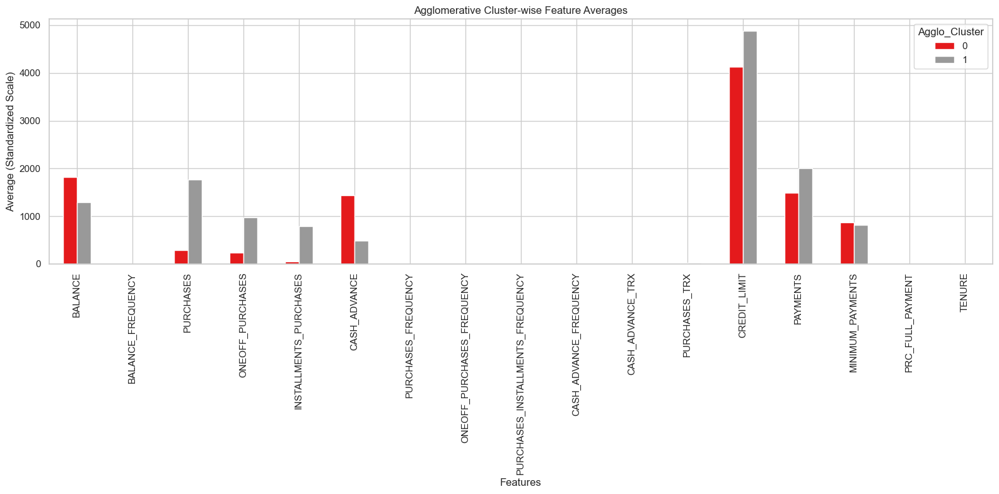

In [115]:
plt.figure(figsize=(14, 10))
agglo_mean.plot(kind='bar', figsize=(16, 8), colormap='Set1')
plt.title('Agglomerative Cluster-wise Feature Averages')
plt.ylabel('Average (Standardized Scale)')
plt.xlabel('Features')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

### Agglomerative Clustering Profile (k=2)

We analyze the mean feature values for the two clusters identified by the Agglomerative Clustering model.

| Feature                             | Cluster 0 (Red)       | Cluster 1 (Blue)       | Key Interpretation |
|-------------------------------------|----------------------|----------------------|---------------------|
| **BALANCE**                         | 1824.49              | 1286.18              | Cluster 0 has higher balances — potential unused credit or conservative spending. |
| **BALANCE_FREQUENCY**              | 0.85                 | 0.90                 | Cluster 1 checks or maintains their balance more frequently — indicating engagement. |
| **PURCHASES**                       | 289.94               | 1766.63              | Cluster 1 makes significantly more purchases — possibly premium cardholders. |
| **ONEOFF_PURCHASES**               | 237.61               | 972.22               | Cluster 1 tends toward large, single transactions. |
| **INSTALLMENTS_PURCHASES**         | 52.46                | 794.89               | Cluster 1 prefers installment payments — may reflect high-value purchases. |
| **CASH_ADVANCE**                    | 1432.93              | 492.88               | Cluster 0 uses cash advances more often — a potential sign of liquidity issues. |
| **PURCHASES_FREQUENCY**            | 0.16                 | 0.84                 | Cluster 1 shops more frequently, indicating regular usage. |
| **ONEOFF_PURCHASES_FREQUENCY**     | 0.10                 | 0.32                 | Higher in Cluster 1 — aligns with their one-time purchase preference. |
| **PURCHASES_INSTALLMENTS_FREQUENCY** | 0.07               | 0.68                 | Installment transactions are more common in Cluster 1. |
| **CASH_ADVANCE_FREQUENCY**         | 0.20                 | 0.07                 | Cash advance is a recurring behavior in Cluster 0 — risk indicator. |
| **CASH_ADVANCE_TRX**               | 4.72                 | 1.67                 | Cluster 0 performs more cash advance transactions. |
| **PURCHASES_TRX**                  | 3.12                 | 27.12                | Cluster 1 is highly transactional — indicates strong customer engagement. |
| **CREDIT_LIMIT**                   | 4133.54              | 4880.39              | Cluster 1 enjoys higher credit limits — potentially better credit history. |
| **PAYMENTS**                        | 1485.15              | 1998.57              | Cluster 1 pays more — consistent with higher spending. |
| **MINIMUM_PAYMENTS**               | 869.51               | 818.58               | Slightly higher in Cluster 0 — possibly relying on minimum payments. |
| **PRC_FULL_PAYMENT**               | 0.03                 | 0.28                 | Cluster 1 is more likely to pay bills in full — a sign of credit discipline. |
| **TENURE**                          | 11.44                | 11.60                | Nearly equal tenure — both segments represent long-term customers. |

---

#### Business Segment Interpretation

**Cluster 0 — Cash-Heavy, At-Risk Customers**
- **Behavior**: Lower purchases, fewer transactions, but high reliance on cash advances.
- **Risk Profile**: May represent users facing liquidity constraints or emergency credit use.
- **Payments**: Low likelihood of paying in full; possibly revolving credit users.
- **Business Insight**:
  - May generate revenue through interest and fees.
  - Could also be high-risk — consider credit counseling or safer lending alternatives.

**Cluster 1 — Active & Responsible Spenders**
- **Behavior**: High transaction volume, prefers installments, regularly uses credit.
- **Risk Profile**: Makes full payments more often, has higher limits, less reliant on cash advances.
- **Business Opportunity**:
  - Profitable and creditworthy.
  - Target with premium products, loyalty programs, and long-term retention strategies.

---

**Summary of Cluster Use-Cases**

| Cluster | Profile Type                  | Risk Level | Actionable Strategy                                      |
|---------|-------------------------------|------------|----------------------------------------------------------|
| 0     | Cash-Oriented, Low Activity   | High       | Limit credit exposure, offer financial planning tools.   |
| 1     | Purchase-Oriented, Engaged    | Low        | Retain and upsell with tailored offers & privileges.     |

### Comparative Cluster Profiling: KMeans vs Agglomerative Clustering (k=2)

Both KMeans and Agglomerative Clustering produced two distinct clusters, aligning strongly in behavioral patterns. Here's a consolidated comparison:

| Feature                             | KMeans Cluster 0 (Cash-Oriented) | KMeans Cluster 1 (Purchase-Oriented) | Agglo Cluster 0 (Cash-Oriented) | Agglo Cluster 1 (Purchase-Oriented) | Key Insight |
|-------------------------------------|--------------------------------------|------------------------------------------|-------------------------------------|------------------------------------------|-------------|
| **BALANCE**                         | 1804.55                              | 1347.77                                  | 1824.49                             | 1286.18                                  | Slightly higher balance in Cluster 0 |
| **BALANCE_FREQUENCY**              | 0.83                                 | 0.92                                     | 0.85                                | 0.90                                     | Cluster 1 monitors account more actively |
| **PURCHASES**                       | 233.91                               | 1697.60                                  | 289.94                              | 1766.63                                  | Cluster 1 is purchase-heavy |
| **ONEOFF_PURCHASES**               | 211.12                               | 936.63                                   | 237.61                              | 972.22                                   | Cluster 1 prefers one-off spending |
| **INSTALLMENTS_PURCHASES**         | 22.94                                | 761.41                                   | 52.46                               | 794.89                                   | Cluster 1 favors installment plans |
| **CASH_ADVANCE**                    | 1494.20                              | 513.72                                   | 1432.93                             | 492.88                                   | Cluster 0 depends more on cash advances |
| **PURCHASES_FREQUENCY**            | 0.11                                 | 0.83                                     | 0.16                                | 0.84                                     | Cluster 1 has regular spending behavior |
| **ONEOFF_PURCHASES_FREQUENCY**     | 0.08                                 | 0.31                                     | 0.10                                | 0.32                                     | Reinforces one-off purchases in Cluster 1 |
| **PURCHASES_INSTALLMENTS_FREQUENCY** | 0.03                              | 0.67                                     | 0.07                                | 0.68                                     | Installment frequency much higher in Cluster 1 |
| **CASH_ADVANCE_FREQUENCY**         | 0.21                                 | 0.07                                     | 0.20                                | 0.07                                     | Cash advance more frequent in Cluster 0 |
| **CASH_ADVANCE_TRX**               | 4.89                                 | 1.76                                     | 4.72                                | 1.67                                     | More cash-related transactions in Cluster 0 |
| **PURCHASES_TRX**                  | 2.08                                 | 26.11                                    | 3.12                                | 27.12                                    | Cluster 1 is highly transactional |
| **CREDIT_LIMIT**                   | 4131.95                              | 4821.33                                  | 4133.54                             | 4880.39                                  | Higher credit limit for Cluster 1 |
| **PAYMENTS**                        | 1510.34                              | 1934.25                                  | 1485.15                             | 1998.57                                  | Cluster 1 pays more — aligns with usage |
| **MINIMUM_PAYMENTS**               | 865.09                               | 826.69                                   | 869.51                              | 818.58                                   | Cluster 0 tends to pay minimum due |
| **PRC_FULL_PAYMENT**               | 0.05                                 | 0.24                                     | 0.03                                | 0.28                                     | Cluster 1 pays in full more often |
| **TENURE**                          | 11.40                                | 11.62                                    | 11.44                               | 11.60                                    | Nearly identical tenure — long-term customers |

---

#### Segment Interpretation Across Models

| Cluster ID | Common Profile Tag          | Description                                                                                   | Business Strategy                                                                 |
|------------|-----------------------------|-----------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------|
| Cluster 0 | **Cash-Oriented / At-Risk** | High cash advances, low purchase activity, low full payments — possible credit stress signal | Risk monitoring, financial counseling, reduce credit line or interest-based products |
| Cluster 1 | **Purchase-Oriented / Disciplined** | Active spenders, high purchase frequency, prefers installments, pays in full more often     | Loyalty rewards, cross-sell premium cards, increase limits, improve retention     |

---

#### Conclusion

Despite using different clustering algorithms:
- Both models **converged on similar customer behaviors**.
- While Agglomerative clustering produces similar segment structures, KMeans shows a slightly better silhouette score at k=2, indicating tighter cluster cohesion in this case.
- While both models produce meaningful segmentation, KMeans shows better cohesion. Agglomerative, though slightly less compact, remains valuable when exploring hierarchical or irregular cluster structures — particularly in exploratory analysis or where non-globular shapes are suspected.

***Next Steps:*** Now we will proceed with the model evaluaiton and also observe the **cluster size distribution** and do the necessary comparisions between the model performances

## 7. Model Evaluation

Let's start the evaluation of K-Means clustering and Agglomerative Clustering with comparing **Silhouette scores**

In [121]:
sil_kmeans = silhouette_score(data_pca, kmeans_labels)
print("Silhouette Score - KMeans:", sil_kmeans)

# For Agglomerative
sil_agglo = silhouette_score(data_pca, agglo_labels)
print("Silhouette Score - Agglomerative:", sil_agglo)

Silhouette Score - KMeans: 0.3715911527932825
Silhouette Score - Agglomerative: 0.3381735913224959


#### Silhouette Score Analysis

The **Silhouette Score** quantifies how well each data point fits within its assigned cluster compared to other clusters.  
It ranges from **-1** to **+1**, where:
- **+1** → Data point is well matched to its own cluster and poorly matched to neighboring clusters (ideal).
- **0**  → Data point lies on or near the decision boundary between two clusters.
- **< 0** → Data point may be assigned to the wrong cluster.

---

##### KMeans (k = 2)
- **Silhouette Score ≈ 0.37**
- Indicates **moderate cluster cohesion and separation**.

##### Agglomerative Clustering (k = 2)
- **Silhouette Score ≈ 0.34**
- Slightly lower than KMeans, suggesting **greater intra-cluster overlap**.

---

#### Summary:

- Both models achieve their **highest silhouette scores at k = 2**, indicating that **2 clusters** is optimal under internal validation.
- **KMeans** slightly outperforms **Agglomerative Clustering**, producing more **compact and well-separated** clusters.
- While the scores are not close to 1, this is **typical in customer segmentation tasks**, where **soft boundaries and behavioral overlap** are expected.

Now, let's plot **Elbow Curve** and annotate the ***WCSS*** at k=2 in K_Means Clustering

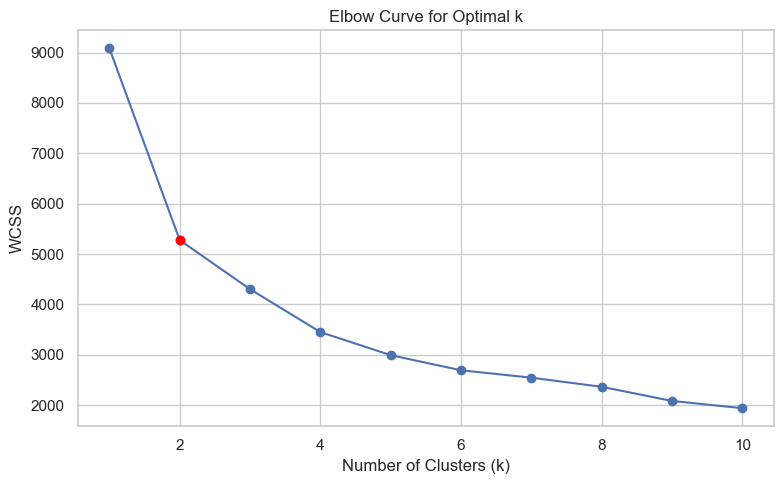

Within Cluster Sum of Squares(WCSS) at k=2 is:5276.843346670546


In [124]:
K = range(1, 11)

plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.title('Elbow Curve for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')

# Annotate WCSS value at k=2
k2_wcss = inertia[1]
plt.scatter(2, k2_wcss, color='red', zorder=5)
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"Within Cluster Sum of Squares(WCSS) at k=2 is:{k2_wcss}")

#### Elbow Curve - KMeans Clustering

- WCSS (Within-Cluster Sum of Squares) helps identify the optimal number of clusters.
- Elbow point is a trade-off between number of clusters and WCSS.
- At **k = 2**, WCSS ≈ ***5276.84*** → annotated in the plot for reference.

#### Dendrogram for Agglomerative Clustering

For **Agglomerative Clustering**, the **dendrogram** is a powerful hierarchical visualization tool used to determine the **optimal number of clusters** by analyzing the vertical distances at which merges occur (linkage distances).

- It helps validate the **hierarchical relationships** between data points — which aligns naturally with the structure of **Agglomerative Clustering**.

- However, dendrograms are computationally expensive and visually cluttered on large datasets (we have ~8950 rows). Rendering a full dendrogram would be both slow and unreadable.

- So what we can do is, plotting the dendrogram on a **subset of 500 rows**, which balances interpretability and computational feasibility.

This subset is used solely for visual inspection and does not affect the actual clustering model applied on the full dataset.

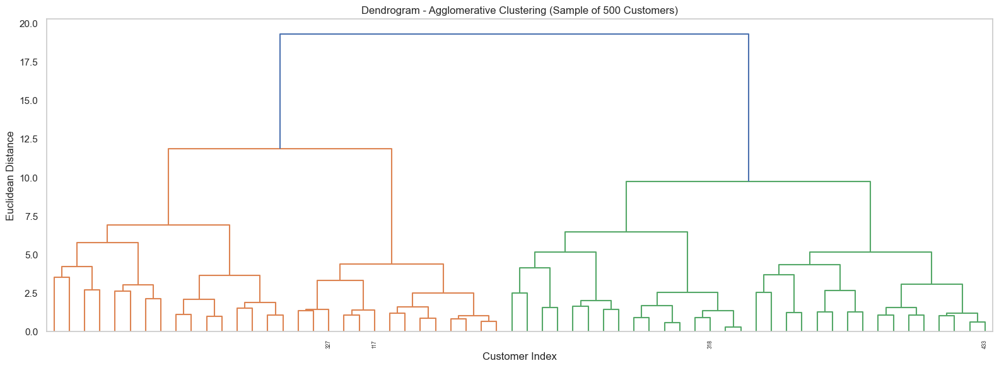

In [127]:
# Sample 500 rows for a clearer dendrogram
sample_data = data_minmax.sample(n=500, random_state=42)

# Step 1: Compute linkage matrix
linked = linkage(sample_data, method='ward')

# Step 2: Plot dendrogram
plt.figure(figsize=(16, 6))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=False,
           truncate_mode='level',  # Show only top levels
           p=5                     # Show top 5 levels of hierarchy
          )
plt.title("Dendrogram - Agglomerative Clustering (Sample of 500 Customers)")
plt.xlabel("Customer Index")
plt.ylabel("Euclidean Distance")
plt.grid(False)
plt.tight_layout()
plt.show()

#### Dendrogram Analysis (Agglomerative Clustering)

To visually evaluate the optimal number of clusters for **Agglomerative Clustering**, we plotted a **dendrogram** on a **random sample of 500 customers**.

- A **dendrogram** shows the hierarchical relationships between observations based on their **merge distances**.
- It is particularly useful for validating how clusters are formed in **hierarchical clustering algorithms** like Agglomerative Clustering.
- Since dendrograms become computationally expensive and unreadable on large datasets, we use a **subset** (e.g., 500 rows) for visualization purposes only.

---

#### Cutoff Threshold

To identify the ideal number of clusters:
- We draw a **horizontal cutoff line** at a merge distance where the longest vertical line is seen **before merges flatten out**.
- In our case, this suggests **2 distinct clusters**, aligning with previous silhouette and elbow findings.

---

**Insight:**  
The dendrogram structure confirms a **natural two-cluster split**, supporting our previous decision to proceed with **k = 2** clusters for both KMeans and Agglomerative Clustering models.

***Next Steps:*** Let's check the cluster alignment before going to cluster size distribution.

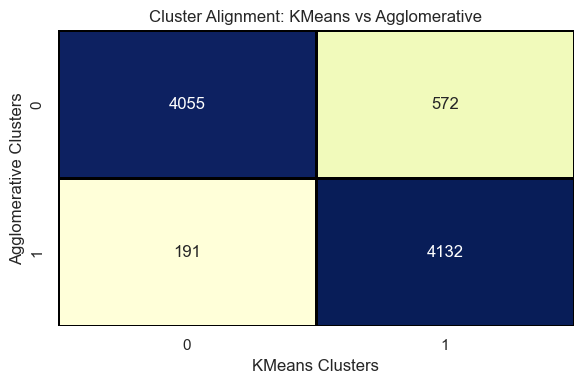

In [130]:
alignment = pd.crosstab(data_profile['Agglo_Cluster'], data_profile['km_Cluster'])
plt.figure(figsize=(6, 4))
sns.heatmap(alignment, annot=True, fmt='d', cmap='YlGnBu', cbar=False, linewidths=1, linecolor='black')
plt.title('Cluster Alignment: KMeans vs Agglomerative')
plt.ylabel('Agglomerative Clusters')
plt.xlabel('KMeans Clusters')
plt.tight_layout()
plt.show()

#### Cluster Alignment: KMeans vs Agglomerative Clustering

- A majority of customers are **consistently grouped** by both algorithms:
  - **4055** customers were classified into Cluster 0 by both.
  - **4132** customers were classified into Cluster 1 by both.
  - Total suffices to ***~91.5%*** agreement rate.
- Only a small number of customers were **differently assigned**:
  - **572** customers classified as Cluster 1 by KMeans but Cluster 0 by Agglomerative.
  - **191** customers classified as Cluster 0 by KMeans but Cluster 1 by Agglomerative.

---

**Insight:**  
- There is **strong agreement** between KMeans and Agglomerative clustering results.  
- This validates the **robustness** of our chosen cluster structure (k = 2), despite slight algorithmic differences in cluster boundaries.

Now let's take a look at **cluster size distribution**

In [133]:
print("KMeans cluster distribution:")
print(pd.Series(data_profile['km_Cluster']).value_counts())

print("\nAgglomerative cluster distribution:")
print(pd.Series(data_profile['Agglo_Cluster']).value_counts())

KMeans cluster distribution:
km_Cluster
1    4704
0    4246
Name: count, dtype: int64

Agglomerative cluster distribution:
Agglo_Cluster
0    4627
1    4323
Name: count, dtype: int64


Let's visualize this distribution for better understanding

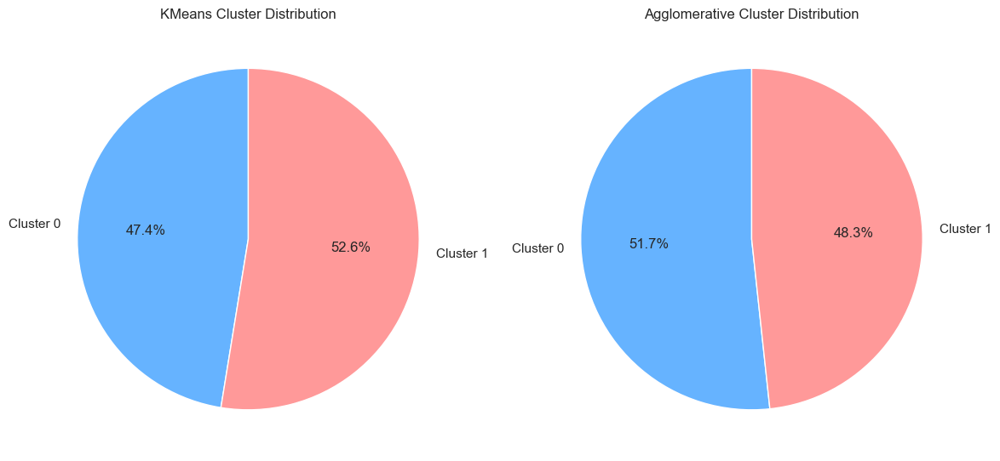

In [135]:
# Cluster distributions
kmeans_counts = [4246, 4704]
agglo_counts = [4627, 4323]

# Labels
labels = ['Cluster 0', 'Cluster 1']
colors = ['#66b3ff', '#ff9999']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# KMeans Pie Chart
axes[0].pie(kmeans_counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
axes[0].set_title('KMeans Cluster Distribution')

# Agglomerative Pie Chart
axes[1].pie(agglo_counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
axes[1].set_title('Agglomerative Cluster Distribution')

# Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.show()

#### Cluster Size Distribution

Understanding the distribution of data points across clusters helps evaluate whether clustering results are **balanced or skewed**, and whether the model might be capturing meaningful structure in the data.

---

##### **KMeans Clustering Distribution**

- **Cluster 0:** 4246 customers  
- **Cluster 1:** 4704 customers  

Distribution is **fairly balanced**, with a **~52%-48% split**, indicating KMeans created two comparably sized groups.

---

##### **Agglomerative Clustering Distribution**

- **Cluster 0:** 4627 customers  
- **Cluster 1:** 4323 customers  

Similarly, Agglomerative Clustering resulted in a **~51%-49% split**, reinforcing the **symmetry** between both clusters.

---

##### **Insight**

Both clustering algorithms produced **well-balanced clusters**, which suggests the customer segmentation is not biased toward a particular group.  
This balance improves the interpretability and applicability of downstream analysis (e.g., profiling, targeting strategies).

Lets proceed with business insights & actionable recommendations on the customers

## 8. Business Insights & Actionable Recommendations

**Customer Segmentation:**

**Cluster 0 – Cash-Oriented / Riskier Segment**

**Behavioral Insights:**
- High usage of **cash advances** and related transactions.
- Lower frequency and volume of purchases (especially one-off and installment-based).
- Less likely to make **full payments** or meet minimum payment obligations.
- Moderate to low credit limits, indicating either risky profiles or lower creditworthiness.

**Business Implications:**
- May pose **higher credit risk** due to irregular repayment behavior.
- Preference for liquidity over purchasing, possibly in financial distress.
- Not highly engaged in product-based transactions or loyalty ecosystems.

**Actionable Recommendations:**
- **Risk Mitigation:**
  - Monitor accounts for delinquency signals or late payments.
  - Offer controlled credit line increases only after consistent payment behavior.
- **Product Realignment:**
  - Promote secured credit products or prepaid card alternatives.
  - Introduce cash advance fee waivers or installment restructuring plans (if targeting retention).
- **Engagement Incentives:**
  - Educate on benefits of converting to installment purchases (lower interest, rewards).
  - Launch tailored rewards for on-time payments or reducing cash advance frequency.

---

**Cluster 1 – Purchase-Oriented / Responsible Segment**

**Behavioral Insights:**
- High purchase activity with a good mix of one-off and installment purchases.
- Consistent payment behavior with high percentage of full or minimum payments.
- Low reliance on cash advances.
- Relatively higher credit limits and better usage ratios.

**Business Implications:**
- Financially responsible and **low-risk customers**.
- Likely to be **loyal** and **profitable**, with higher lifetime value.
- Strong candidates for cross-sell and premium product upgrades.

**Actionable Recommendations:**
- **Retention & Loyalty:**
  - Offer premium cards, travel or lifestyle benefits, and cashbacks.
  - Launch targeted loyalty programs or milestone-based incentives.
- **Credit Expansion:**
  - Safely increase credit limits based on usage and repayment trends.
  - Introduce EMI offers, balance transfers, or interest-saving plans.
- **Cross-Sell Opportunities:**
  - Suggest co-branded cards, insurance, or small loans.
  - Promote digital wallet or app-based engagement to build ecosystem stickiness.